In [11]:
# Extract all relevant shapefiles.

import zipfile
import os

SHAPEFILES = {
    "parcels": "input_data/Parcels.zip",
    "Hydrology_Polygons": "input_data/Hydrology_Polygons.zip"
}

In [4]:
# helper functions
from datetime import date
import pandas as pd

class APNTools:
    """
    Assessor Parcel Number conversion tools
    
    An APN is made up of four parts:
      * book number (3 digits, zero-padded)
      * page number (4 digits, zero-padded)
      * parcel number (3 digits, zero-padded)
      * sub-parcel number (4 digits, zero-padded)
    
    Common representations:
      * 111-2222-333-4444
      * 11122223334444
    """
    @staticmethod
    def norm(apn):
        if type(apn) in (int, str):
            return int(apn)
        elif type(apn) == list and len(apn) == 4:
            apn = [int(part) for part in apn]
            return int(f"{apn[0]:03}{apn[1]:04}{apn[2]:03}{apn[3]:04}")
    
    @staticmethod
    def pretty(norm_apn):
        padded = f"{norm_apn:014}"
        return f"{padded[0:3]}-{padded[3:7]}-{padded[7:10]}-{padded[10:14]}"

assert APNTools.norm(122223330044) == 122223330044
assert APNTools.norm([1, 2222, 333, 44]) == 122223330044
assert APNTools.norm(["001", 2222, 333, 44]) == 122223330044
assert APNTools.norm("00122223330044") == 122223330044
assert APNTools.norm("00000001000000") == 1000000
assert APNTools.norm("00000000000001") == 1
assert APNTools.norm("00000000000000") == 0
assert APNTools.pretty(122223330044) == "001-2222-333-0044"
assert APNTools.pretty(3330044) == "000-0000-333-0044"
assert APNTools.pretty(0) == "000-0000-000-0000"
print("APNTools tests passed")

class DateTools:
    @staticmethod
    def norm_value_dt(value_dt):
        day, month, year = value_dt.split("-")
        day = int(day)
        month = {
            "JAN": 1,
            "FEB": 2,
            "MAR": 3,
            "APR": 4,
            "MAY": 5,
            "JUN": 6,
            "JUL": 7,
            "AUG": 8,
            "SEP": 9,
            "OCT": 10,
            "NOV": 11,
            "DEC": 12,
        }[month]
        year = int(year)
        year = year + 2000 if year < 24 else year + 1900
        return date(year, month, day)

    @staticmethod
    def norm_recording_date(recording_date):
        recording_date = int(recording_date)
        year = int(recording_date / 10000)
        month = int(recording_date % 10000 / 100)
        day = int(recording_date % 100)
        try:
            return date(year, month, day)
        except ValueError as exc:
            #print(f"date({year}, {month}, {day}) from {recording_date}")
            return None
    
assert DateTools.norm_value_dt("15-JAN-03") == date(2003, 1, 15)
assert DateTools.norm_value_dt("01-JAN-03") == date(2003, 1, 1)
assert DateTools.norm_value_dt("15-JAN-23") == date(2023, 1, 15)
assert DateTools.norm_value_dt("15-JAN-24") == date(1924, 1, 15)
assert DateTools.norm_recording_date(20030115) == date(2003, 1, 15)
assert DateTools.norm_recording_date("20030101") == date(2003, 1, 1)
assert DateTools.norm_recording_date("20230115") == date(2023, 1, 15)
assert DateTools.norm_recording_date("19240115") == date(1924, 1, 15)
print("DateTools tests passed")

home_index_df = pd.read_csv("input_data/HPI_PO_metro.txt", sep="	")
home_index_df = home_index_df.query("metro_name == 'Sacramento-Roseville-Folsom, CA'")
home_index_df = home_index_df.rename(columns={"yr": "ASSESSMENT_YEAR", "qtr": "ASSESSMENT_QUARTER"})
current_index = home_index_df[
    (home_index_df["ASSESSMENT_YEAR"] == 2022) & (home_index_df["ASSESSMENT_QUARTER"] == 4)
].iloc[0]["index_sa"]
oldest_index = home_index_df[
    (home_index_df["ASSESSMENT_YEAR"] == 1991) & (home_index_df["ASSESSMENT_QUARTER"] == 1)
].iloc[0]["index_sa"]

APNTools tests passed
DateTools tests passed
PropValueTools tests passed


In [5]:
import os
import shutil
import zipfile
import pandas as pd

SECURED_ROLL_ZIP_FILENAME = "input_data/2022_Secured_Public_Roll.zip"
SECURED_ROLL_PATH_IN_ARCHIVE = "2022_Secured_Public_Roll/secured_roll_public.txt"
SECURED_ROLL_EXTRACT_DIR = "extracted_data/"
SECURED_ROLL_DEST_DATA_PATH = os.path.join(SECURED_ROLL_EXTRACT_DIR, SECURED_ROLL_PATH_IN_ARCHIVE)

print(f"Processing input file: {SECURED_ROLL_ZIP_FILENAME}")
with zipfile.ZipFile(SECURED_ROLL_ZIP_FILENAME, "r") as zip_ref:
    assert SECURED_ROLL_PATH_IN_ARCHIVE in zip_ref.namelist()
    if not os.path.exists(SECURED_ROLL_DEST_DATA_PATH):
        shapedata = zip_ref.extractall(path=SECURED_ROLL_EXTRACT_DIR)
    assert os.path.exists(SECURED_ROLL_DEST_DATA_PATH)
    print(f"Complete.  Wrote {SECURED_ROLL_DEST_DATA_PATH}")
    
secured_roll = pd.read_csv(SECURED_ROLL_DEST_DATA_PATH, sep=";")
secured_roll["APN"] = secured_roll.apply(
    lambda row: APNTools.norm([row["MAPB"], row["PG"], row["PCL"], row["PSUB"]]),
    axis=1,
)

secured_roll

Processing input file: input_data/2022_Secured_Public_Roll.zip
Complete.  Wrote extracted_data/2022_Secured_Public_Roll/secured_roll_public.txt


/home/sankey/tmp/pyenv/versions/3.9.9/envs/value-per-acre-3.9/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3251: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,MAPB,PG,PCL,PSUB,TAX_RATE_AREA,SITUS_NUMBER,SITUS_CITY,SITUS_STREET,SITUS_ZIP,OWNER_CODE,...,LAND,IM,FIXTURE,PP,HO_EX,EX,VALUE_DT,NGH,ACTION_CODE,APN
0,1,11,1,0,3169.0,221.0,SACRAMENTO,JIBBOOM ST,95811,0.0,...,462058,577577,0,0,0,0,15-MAY-14,T0000,S ...,100110010000
1,1,11,3,0,3169.0,225.0,SACRAMENTO,JIBBOOM ST,95811,0.0,...,624688,407162,255951,89888,0,0,05-JAN-16,T0000,S ...,100110030000
2,1,11,4,0,3169.0,227.0,SACRAMENTO,JIBBOOM ST,95811,0.0,...,494671,2533133,0,0,0,0,20-DEC-19,T0000,S ...,100110040000
3,1,11,5,0,3169.0,231.0,SACRAMENTO,JIBBOOM ST,95811,0.0,...,381309,1559247,0,0,0,0,20-DEC-19,T0000,S ...,100110050000
4,1,12,1,0,3312.0,100.0,SACRAMENTO,JIBBOOM ST,95811,10.0,...,0,0,0,0,0,0,01-JAN-00,T0000,0 ...,100120010000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489104,825,901,110,0,55015.0,12690.0,GALT,ARABIAN LN,95632,0.0,...,0,77000,0,0,0,0,31-DEC-21,Z0000,D ...,82509011100000
489105,825,901,111,0,51027.0,9944.0,WILTON,ALTA MESA RD,95693,0.0,...,0,140000,0,0,0,0,31-DEC-21,Z0000,D ...,82509011110000
489106,825,901,112,0,55005.0,11077.0,WILTON,ALTA MESA RD,95693,0.0,...,0,173360,0,0,0,0,31-DEC-21,Z0000,D ...,82509011120000
489107,990,7854,0,2,2.0,NaN,NaN,PO BOX,0,0.0,...,0,0,0,0,0,0,01-JAN-00,Z0000,0 ...,99078540000002


In [6]:
municipal_configs = {
    "Sacramento": {
        "views": {
            "default": {
                "xlim": (-121.5598, -121.381),
                "ylim": (38.4568, 38.6394),
            }
        }
    }
}

In [7]:
# Prepare some generally helpful landuse features that can be useful for better context about the area.  These
# essentially serve as a "baselayer".

import geopandas as gpd

water = gpd.read_file(SHAPEFILES['Hydrology_Polygons']).to_crs(epsg=4326)

In [8]:
from contextlib import contextmanager
import time

@contextmanager
def show_time(name):
    start = time.process_time()
    yield
    end = time.process_time()
    print(f"Timing of {name} => {end - start}s")

In [9]:
# This cell contains most of the shared mapping code.  It's reponsible for looping over each view of
# each municipality, generating pretty titles, combining multiple layers into a plot and saving the outputs.

import geopandas as gpd
import matplotlib.pyplot as plt
from IPython.display import Image, display
from mpl_toolkits.axes_grid1 import make_axes_locatable

def generate_maps(
    map_type_title=None,
    map_type_code=None,
    process_parcels=None,
    plot_column=None,
    get_vmax=None,
    get_vmin=None,
    cmap="inferno",
):
    for municipal_name, municipal_config in municipal_configs.items():
        with show_time("gpd.read_file()"):
            parcels = gpd.read_file(SHAPEFILES['parcels']).to_crs(epsg=4326)
        # Process the parcels to add a field to plot.
        with show_time("process_parcels()"):
            parcels = process_parcels(parcels=parcels)
        out_shp_filename = f"renders/{map_type_code}.gpkg"

        for view_name, view_config in municipal_config["views"].items():
            filename_suffix = municipal_name if view_name == "default" else f"{municipal_name}_{view_name}"
            out_filename = f"renders/{map_type_code}_{filename_suffix}.jpg"

            # Start to create plot.
            fig, ax = plt.subplots(figsize = (8.5,11))
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size=0.3, pad=0.0)

            # Plot all the layers
            water.plot(ax=ax, color=(0.6, 0.7, 0.8))
            parcels.plot(
                column=plot_column,
                ax=ax,
                cax=cax,
                cmap=cmap,
                vmin=get_vmin(parcels),
                vmax=get_vmax(parcels),
                legend=True
            )

            # Configure the rest of the figure parameters.
            municipal_subtitle = "" if view_name == "default" else f" ({view_name.title()})"
            ax.set_title(f"{municipal_name}{municipal_subtitle}: {map_type_title}", fontdict = {"fontsize": 17})
            if "xlim" in view_config:
                # We have configured some custom limits for this municipality.
                ax.set_xlim(*view_config["xlim"])
                ax.set_ylim(*view_config["ylim"])
            else:
                # Assume that we just want to use the extent of the municipal boundary as the plot limits.
                ax.set_xlim([municipal_boundary.total_bounds[0],  municipal_boundary.total_bounds[2]])
                ax.set_ylim([municipal_boundary.total_bounds[1],  municipal_boundary.total_bounds[3]])
            fig.set_dpi(600.0)
            ax.axes.get_xaxis().set_ticks([])
            ax.axes.get_yaxis().set_ticks([])
            ax.annotate(
                "Source: Sacramento County, 2023",
                xy=(10, 10),
                xycoords="axes points",
                horizontalalignment="left",
                verticalalignment="bottom",
                fontsize=10,
                color=(0.2, 0.2, 0.2, 0.5),
                backgroundcolor=(1, 1, 1, 0.7),
            )

            jpeg_args = {"optimize": True, "quality": 92}
            with show_time("savefig()"):
                plt.savefig(out_filename, bbox_inches="tight", pil_kwargs=jpeg_args, dpi=600)
            print(f"Saved {out_filename}")
            plt.close()

            if municipal_name == "Sacramento" and view_name == "default":
                display(Image(filename=out_filename))
                
        parcels.to_file(out_shp_filename)

        # Free memory to make room for next batch of parcels.
        del parcels

Timing of gpd.read_file() => 35.71223512900001s
Timing of parcels.merge() => 1.1957212049999981s
Timing of DateTools.norm_value_dt() => 0.5516071130000029s
Timing of ASR_TOTAL_P13 => 3.006613053999999s
Timing of area() => 18.432923362999993s
Timing of strftime() => 0.9382354220000053s
Timing of process_parcels() => 25.838896193999993s
Timing of savefig() => 2.156677740999953s
Saved renders/revenue_per_acre_Sacramento.jpg


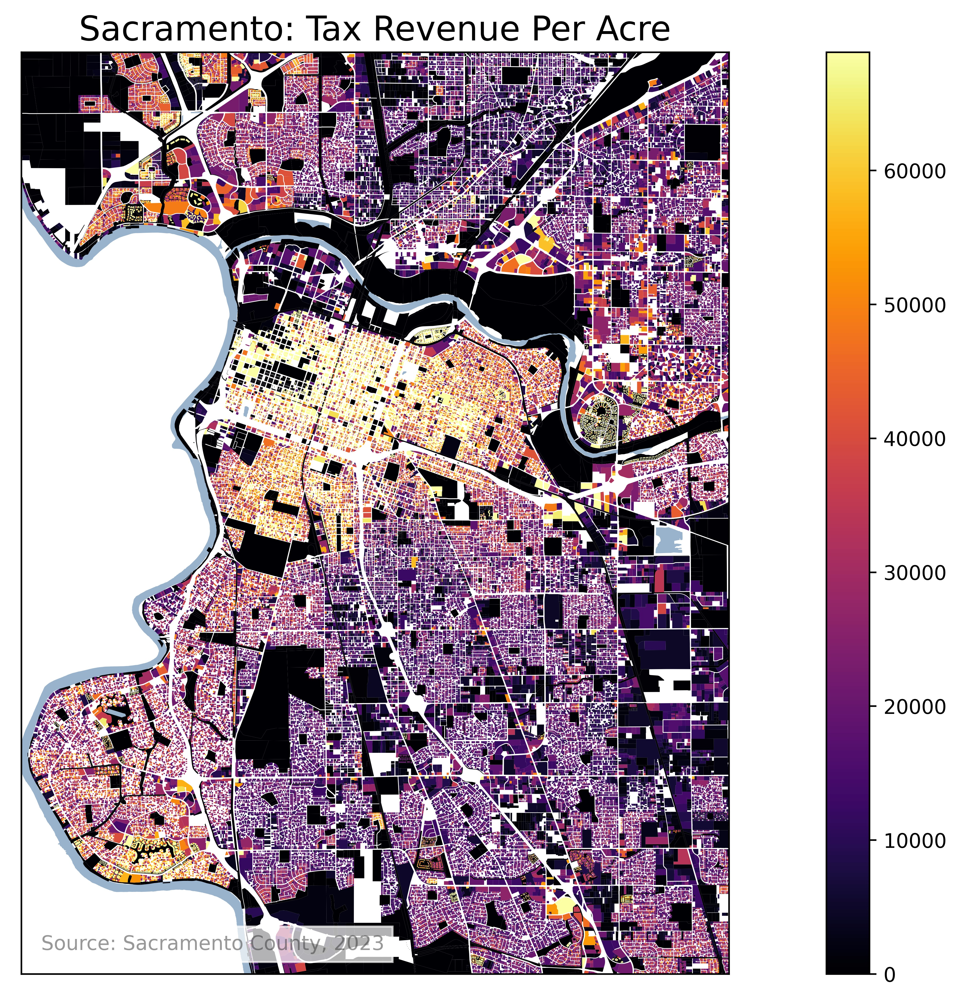

Timing of generate_maps() => 545.000476519s


In [10]:
# Finally, generate Tax Revenue Per Acre plots for each municipality.  

def process_parcels_revenu_per_acre(parcels=None):
    # Join tax rates data so that we know what the tax rate is for each parcel.
    #parcels = parcels.merge(tax_rates, on="TRA")
    parcels["TAX_RATE"] = 1.2  # TODO: make this dynamic.
    # Join the assessment data into the parcels.
    parcels["APN"] = parcels["APN"].astype(int)
    with show_time("parcels.merge()"):
        parcels = parcels.merge(secured_roll, on="APN")
    # Normalize date fields.
    parcels = parcels.dropna(axis=0, subset=["VALUE_DT"])
    with show_time("DateTools.norm_value_dt()"):
        parcels["VALUE_DT"] = parcels["VALUE_DT"].map(DateTools.norm_value_dt)
    # Sum the land value, improvement value, and fixture value of the parcel to come up with
    # the total assessed value.
    parcels["ASR_TOTAL"] = parcels["LAND"] + parcels["IM"] + parcels["FIXTURE"]
    with show_time("ASR_TOTAL_P13"):
        parcels["ASSESSMENT_QUARTER"] = parcels["VALUE_DT"].map(lambda dt: (dt.month-1)//3 + 1)
        parcels["ASSESSMENT_YEAR"] = parcels["VALUE_DT"].map(lambda dt: dt.year)
        parcels = parcels.merge(home_index_df, on=["ASSESSMENT_YEAR", "ASSESSMENT_QUARTER"])
        parcels["ASR_TOTAL_P13"] = parcels["ASR_TOTAL"] * current_index / parcels["index_sa"]
    # Only parcels with valid tax rates and assessment values
    parcels = parcels.dropna(axis=0, subset=["TAX_RATE", "ASR_TOTAL"])
    # First, re-project geometries to an equal-area projection (EPSG:3395) with units in meters.
    # Then, calculate the acres of each geometry, dividing by the magic number 4046.8564 to convert m^2 to acre.
    with show_time("area()"):
        parcels["AREA_ACRES"] = parcels["geometry"].to_crs(epsg=3395).map(
            lambda g: g.area / 4046.8564
        )
    # TAX_RATE was determined by the Tax Rate Area (TRA) of the parcel in a previous cell.  Value in percent.
    # ASR_TOTAL is defined as the "Total assessed value" of the property.  See Parcels.pdf for more details.
    parcels["TAX_REVENUE"] = parcels["TAX_RATE"] / 100 * parcels["ASR_TOTAL"]
    parcels["TAX_REVENUE_P13"] = parcels["TAX_RATE"] / 100 * parcels["ASR_TOTAL_P13"]
    # Finally, calculate the metric we want to display in colors.
    parcels["TAX_REVENUE_PER_ACRE"] = parcels["TAX_REVENUE"] / parcels["AREA_ACRES"]
    parcels["TAX_REVENUE_PER_ACRE_P13"] = parcels["TAX_REVENUE_P13"] / parcels["AREA_ACRES"]
    # geopandas can't write datetime.date values, convert to string:
    with show_time("strftime()"):
        parcels["VALUE_DT"] = parcels["VALUE_DT"].map(lambda d: d.strftime('%Y-%m-%d')) #Convert the datetimes to strings
    #parcels = parcels.rename(columns={
    #    "ASR_TOTAL": "ASR_T",
    #    "ASR_TOTAL_P13": "ASR_T_P13",
    #    "TAX_REVENUE": "REV",
    #    "TAX_REVENUE_P13": "REV_P13",
    #    "TAX_REVENUE_PER_ACRE_P13": "RPA",
    #    "TAX_REVENUE_PER_ACRE_P13": "RPA_P13",
    #})
    return parcels

with show_time("generate_maps()"):
    generate_maps(
        map_type_title="Tax Revenue Per Acre",
        map_type_code="revenue_per_acre",
        process_parcels=process_parcels_revenu_per_acre,
        plot_column="TAX_REVENUE_PER_ACRE_P13",
        get_vmin=lambda p: 0,
        get_vmax=lambda p: p["TAX_REVENUE_PER_ACRE_P13"].quantile(0.95)
    )

Timing of gpd.read_file() => 38.043139880000126s
normalizing VALUE_DT...
extracting year...
finished processing parcels.
Timing of process_parcels() => 3.2823545849996663s
Timing of savefig() => 2.390119407000384s
Saved renders/assessment_value_dt_visualizer_Sacramento.jpg


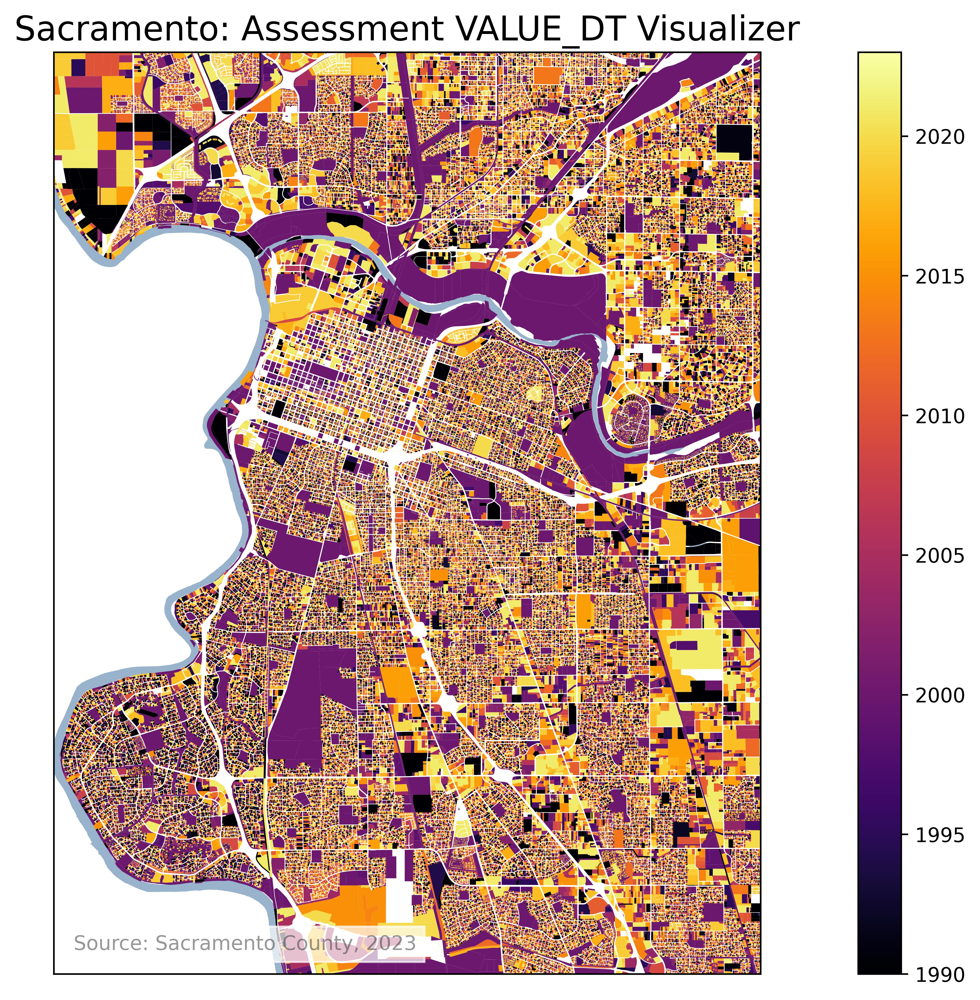

In [177]:
import numpy as np

def process_parcels_value_dt_visualizer(parcels=None):
    # Join the assessment data into the parcels.
    parcels["APN"] = parcels["APN"].astype(int)
    parcels = parcels.merge(secured_roll, on="APN")
    parcels = parcels.dropna(axis=0, subset=["VALUE_DT"])
    print("normalizing VALUE_DT...")
    parcels["VALUE_DT"] = parcels["VALUE_DT"].map(DateTools.norm_value_dt)
    print("extracting year...")
    parcels["VALUE_DT_YEAR"] = parcels["VALUE_DT"].map(lambda d: d.year)
    #month = parcels["DOCDATE"].str[0:2].astype(int)
    #day   = parcels["DOCDATE"].str[2:4].astype(int)
    #year  = parcels["DOCDATE"].str[4:6].astype(int)
    #year[year > 22] += 1900
    #year[year <= 22] += 2000
    #parcels["DOCDATE_YEAR"] = year
    print("finished processing parcels.")
    return parcels

generate_maps(
    map_type_title="Assessment VALUE_DT Visualizer",
    map_type_code="assessment_value_dt_visualizer",
    process_parcels=process_parcels_value_dt_visualizer,
    plot_column="VALUE_DT_YEAR",
    get_vmin=lambda p: np.int64(1990),
    get_vmax=lambda p: np.int64(2023),
)

Timing of gpd.read_file() => 83.97649991800063s
Timing of parcels.merge() => 2.834768303999226s
Timing of DateTools.norm_value_dt() => 1.392482715999904s
Timing of ASR_TOTAL_P13 => 7.612031167000168s
Timing of area() => 37.246967821s
Timing of strftime() => 2.5089532100000724s
Timing of process_parcels() => 57.00090471300064s
Timing of savefig() => 3.1155564310001864s
Saved renders/subsidizer_or_subsidized_Sacramento.jpg


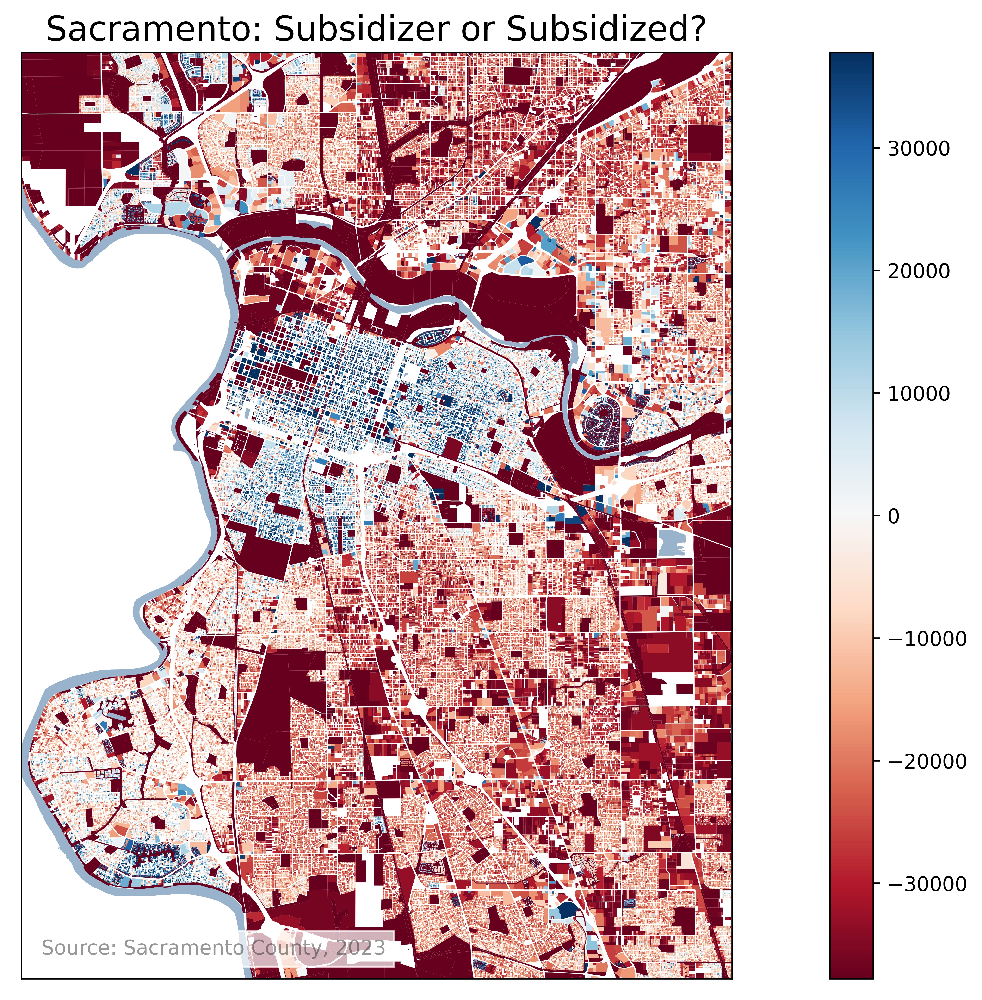

Timing of generate_maps() => 281.3657679850003s


In [180]:
# Finally, generate Tax Revenue Per Acre plots for each municipality.  

def process_parcels_subsidizer_or_subsidized(parcels=None):
    # Join tax rates data so that we know what the tax rate is for each parcel.
    #parcels = parcels.merge(tax_rates, on="TRA")
    parcels["TAX_RATE"] = 1.2  # TODO: make this dynamic.
    # Join the assessment data into the parcels.
    parcels["APN"] = parcels["APN"].astype(int)
    with show_time("parcels.merge()"):
        parcels = parcels.merge(secured_roll, on="APN")
    # Normalize date fields.
    parcels = parcels.dropna(axis=0, subset=["VALUE_DT"])
    with show_time("DateTools.norm_value_dt()"):
        parcels["VALUE_DT"] = parcels["VALUE_DT"].map(DateTools.norm_value_dt)
    # Sum the land value, improvement value, and fixture value of the parcel to come up with
    # the total assessed value.
    parcels["ASR_TOTAL"] = parcels["LAND"] + parcels["IM"] + parcels["FIXTURE"]
    with show_time("ASR_TOTAL_P13"):
        parcels["ASSESSMENT_QUARTER"] = parcels["VALUE_DT"].map(lambda dt: (dt.month-1)//3 + 1)
        parcels["ASSESSMENT_YEAR"] = parcels["VALUE_DT"].map(lambda dt: dt.year)
        parcels = parcels.merge(home_index_df, on=["ASSESSMENT_YEAR", "ASSESSMENT_QUARTER"])
        parcels["ASR_TOTAL_P13"] = parcels["ASR_TOTAL"] * current_index / parcels["index_sa"]
    # Only parcels with valid tax rates and assessment values
    parcels = parcels.dropna(axis=0, subset=["TAX_RATE", "ASR_TOTAL"])
    # First, re-project geometries to an equal-area projection (EPSG:3395) with units in meters.
    # Then, calculate the acres of each geometry, dividing by the magic number 4046.8564 to convert m^2 to acre.
    with show_time("area()"):
        parcels["AREA_ACRES"] = parcels["geometry"].to_crs(epsg=3395).map(
            lambda g: g.area / 4046.8564
        )
    # TAX_RATE was determined by the Tax Rate Area (TRA) of the parcel in a previous cell.  Value in percent.
    # ASR_TOTAL is defined as the "Total assessed value" of the property.  See Parcels.pdf for more details.
    parcels["TAX_REVENUE_P13"] = parcels["TAX_RATE"] / 100 * parcels["ASR_TOTAL_P13"]
    parcels["TAX_REVENUE_PER_ACRE_P13"] = parcels["TAX_REVENUE_P13"] / parcels["AREA_ACRES"]
    # Finally, calculate the metric we want to display in colors.
    median_tax_revenue_per_acre = parcels["TAX_REVENUE_PER_ACRE_P13"].quantile(0.75)
    parcels["OWNER_SUBSIDIZING_PER_ACRE"] = \
        parcels["TAX_REVENUE_PER_ACRE_P13"] - median_tax_revenue_per_acre
    # geopandas can't write datetime.date values, convert to string:
    with show_time("strftime()"):
        parcels["VALUE_DT"] = parcels["VALUE_DT"].map(lambda d: d.strftime('%Y-%m-%d')) #Convert the datetimes to strings
    return parcels

with show_time("generate_maps()"):
    generate_maps(
        map_type_title="Subsidizer or Subsidized?",
        map_type_code="subsidizer_or_subsidized",
        process_parcels=process_parcels_subsidizer_or_subsidized,
        plot_column="OWNER_SUBSIDIZING_PER_ACRE",
        get_vmin=lambda p: -min(
            abs(p["OWNER_SUBSIDIZING_PER_ACRE"].quantile(0.05)),
            abs(p["OWNER_SUBSIDIZING_PER_ACRE"].quantile(0.05)),
        ),
        get_vmax=lambda p: min(
            abs(p["OWNER_SUBSIDIZING_PER_ACRE"].quantile(0.05)),
            abs(p["OWNER_SUBSIDIZING_PER_ACRE"].quantile(0.05)),
        ),
        cmap="RdBu",
    )